# Super Deli API Tutorial

First, import the necessary modules

In [20]:
import numpy as np
import pandas as pd

from read_input.read_input import GenotypeData
import read_input.impute as impute

from dim_reduction.dim_reduction import DimReduction
from dim_reduction.embed import *
from clustering.clustering import *
%reload_ext autoreload
%autoreload 2

print("Using numpy version {}\nUsing pandas version {}".format(np.__version__, pd.__version__))

Using numpy version 1.19.5
Using pandas version 1.1.5


# 1. Genotype Data Object

## 1.1 Load Data

Then load the data into a GenotypeData object.  
The GenotypeData object is used throughout the API, and multiple useful attributes  
can be accessed from it.  

GenotypeData does the necessary file conversions.  
All you have to do is input a PHYLIP or STRUCTURE formatted file and a population map (popmap).  

If using a STRUCTURE file, Super Deli supports both the 2 rows per individual and 1 row per individual formats.  
Also, the structure file can have population IDs as the 2nd column, but if not, then the population IDs need  
to be supplied with a popmap file.  

In [21]:
filename="./example_data/structure_files/test.nopops.str"
filetype="structure2row"
popmapfile="./example_data/popmaps/test.popmap"

data = GenotypeData(filename=filename, filetype=filetype, popmapfile=popmapfile)


Reading structure file ./example_data/structure_files/test.nopops.str...
Done!

Converting genotypes to one-hot encoding...
Done!

Converting genotypes to 012 format...
Done!

Found 2024 SNPs and 117 individuals...



## 1.2 GenotypeData Attributes

Multiple useful attributes can be accessed from a GenotypeData object.  

For example, 

```data = GenotypeData(filename=filename, filetype=filetype, popmapfile=popmapfile)```  

1. ```data.individuals```: List of the sample IDs 

2. ```data.pops```: List of the population IDs.

3. ```data.indcount```: Number of individuals in the input sequence file.  

4. ```data.snpcount```: Number of SNPs in the input dataset.  

5. ```data.genotypes_list```: 012-encoded genotypes as a 2D list

6.  ```data.genotypes_nparray```: 012-encoded genotypes as a numpy.ndarray

7. ```data.genotypes_df```: 012-encoded genotypes as a pandas.DataFrame

8. ```data.genotypes_onehot```: One-hot encoded genotypes as a numpy.ndarray.  

9. ```data.imputed_knn_df```: K-Nearest Neighbor (method #1 below) imputed 012-encoded genotypes as a pandas.DataFrame

10. ```data.imputed_knn```: K-Nearest Neighbor (method #1 below) imputed 012-encoded genotypes as a 2D list

11. ```data.imputed_freq_global```: 012-encoded genotypes imputed by global allele frequency

12. ```data.imputed_freq_global_df```: 012-encoded genotypes imputed by global allele frequency as a pandas DataFrame

13. ```data.imputed_freq_pop```: 012-encoded genotypes imputed by population-wise allele frequency

14. ```data.imputed_freq_pop_df```: 012-encoded genotypes imputed by population-wise allele frequency as a pandas DataFrame

15. ```data.imputed_rf_np```: 012-encoded genotypes imputed by random forest iterative imputation as a numpy.ndarray

16. ```data.imputed_rf_df```: 012-encoded genotypes imputed by random forest iterative imputation as a pandas.DataFrame

17. ```data.imputed_gb_np```: 012-encoded genotypes imputed by gradient boosting iterative imputation as a numpy.ndarray

18. ```data.imputed_gb_df```: 012-encoded genotyes imputed by gradient boosting iterative imputation as a pandas.DataFrame

19. ```data.imputed_br_np```: 012-encoded genotypes imputed by Bayesian ridge iterative imputation as a numpy.ndarray

20. ```data.imputed_br_df```: 012-encoded genotypes imputed by Bayesian ridge iterative imputation as a pandas.DataFrame

21. ```data.imputed_knn_iter_np```: 012-encoded genotypes imputed by K-Nearest Neighbors iterative imputation as a numpy.ndarray

22. ```data.imputed_knn_iter_df```: 012-encoded genotypes imputed by K-Nearest Neighbors iterative imputation as a pandas.DataFrame



## 1.3 Impute Missing Data

Many of the machine learning algorithms require no missing data. 
Thus, we have implemented several imputation methods.  

Currently supported imputation methods include: 

1. Global allele frequency
2. By-population allele frequency
3. K-Nearest Neighbors (Standard with Manual K)
4. K-Nearest Neighbors (Standard with K-optimization)
5. K-Nearest Neighbors (Iterative Imputation)
6. Random Forest (Iterative Imputation)
7. Gradient Boosting (Iterative Imputation)
8. Bayesian Ridge (Iterative Imputation)
9. Phylogenetic Tree-based imputation

The iterative imputation methods use n_nearest_features of the most similar SNP sites to inform the imputation.  
Leaving n_nearest_features as None will use all sites, but it consumes a lot of memory and is not computationally tractable.  

For the phylogenetic tree-based method, you must supply an input tree, and it uses close-by samples to inform the imputation.  

To run the imputation, you just call ```GenotypeData.impute_missing()``` and supply the necessary arguments. 

E.g., if you want to impute missing data by gradient boosting and random forest iterative imputation, you can just do this:

```data.impute_missing(impute_methods=["gb", "rf"])```

You can supply a list of methods if you want to try multiple. Settings for each method can be supplied as a dictionary. For example, if you want to set the n_nearest features to 100 and increase the number of iterations, do this:

```imputation_settings = {"gb_n_iter": 1000, "n_nearest_features": 100}```

```impute_missing()``` is commented out here because I already ran the imputation.   


In [15]:
# Define imputation settings
#imputation_settings = {"gb_n_iter": 1000, "n_nearest_features": 100}

# Impute missing data
#data.impute_missing(impute_methods="gb", impute_settings=imputation_settings)

## 1.4 Read Imputed Data From File

Imputation can take a while, so if you've already run the imputation you can just re-load the imputed file with ```GenotypeData.read_imputed```.  

Multiple imputation methods can be specified by passing a list to the ```impute_methods``` argument.  

In [3]:
data.read_imputed("example_data/imputed/gb_iterative_imputed_012.csv", impute_methods="gb")

# 2. Dimensionality Reduction 

Dimensionality reduction is very useful for visualizing complex relationships among samples in 2-dimensional or 3-dimensional plots. It tries to preserve high-dimensional signals in a lower-dimension "embedding". 

## 2.1 DimReduction Object

Now you can define a DimReduction object to use with most of the downstream functions.  

You need to supply the 012-encoded genotypes, a list of population IDs, an output file prefix, and the number of replicates to do with the reps argument if you want to run each step multiple times to assess the variation among runs (recommended).

Fortunately, many attributes can be accessed from the GenotypeData object, including the imputed data as a pandas dataframe, the populations IDs, the sample IDs, and more (See section 1.2). 

Additionally, you can define a custom color palette to use among some of the plots. Otherwise, it uses a default matplotlib color palette (default is "Set1"). The colors argument should just be a dictionary with unique population IDs as the keys and hex-code colors as the corresponding values.  

This step doesn't have to be done before using the downstream methods, but if you don't create a DimReduction object now you'll have to supply relevant arguments for every method. So it makes sense to just have to do it once here.  


In [22]:
colors = {
    "GU": "#FF00FF",
    "EA": "#FF8C00",
    "TT": "#228B22",
    "TC": "#6495ED",
    "DS": "#00FFFF",
    "ON": "#800080",
    "CH": "#696969",
    "FL": "#FFFF00",
    "MX": "#FF0000"
}

dr = DimReduction(data.imputed_gb_df, data.populations, "test", reps=2, colors=colors)


## 2.2 Supported Dimensionality Reduction Methods

There are several available methods for dimensionality reduction, including:

1. Principal Component Analysis (PCA)
2. Multidimensional Scaling (MDS)
3. t-Distributed Stochastic Neighbor Embedding (t-SNE)

### 2.2.1 Random Forest Embedding

Additionally, Super Deli supports Random Forest Embedding, which transforms high-dimensional data as a one-hot encoded sparse dataset that also is high-dimensional. In our experience this improves the other embeddings when the dissimilarity matrix (i.e., which is a distance matrix) from the random forest embedding is supplied instead of the 012-encoded genotypes data. We strongly recommend doing the Random Forest Embedding prior to doing MDS, t-SNE, and any of the clustering algorithms. 

### 2.2.2 PCA

So first, we're going to run a PCA. There is a plot_cumvar argument that allow you to inspect the cumulative explained variance for an initial PCA, and there are two methods available for choosing the optimal number of principal components to retain.  

The number of PCs to retain can be chosen by:

1. elbow method - Choose the inflection point where cumulative variance does not improve much with the addition of more PCs.
2. percentage of PCs
3. Manually

You can specify whether to show the cumulative variance plot. Either way it gets saved to disk.  

There are lots of plot settings that can be changed for customization.  

Here we use the elbow method to get the inflection point.  



Doing PCA...


PCA Settings:
	n_components: 116
	scaler: None


Finshed 'fit_transform' in 0:00:00.051888



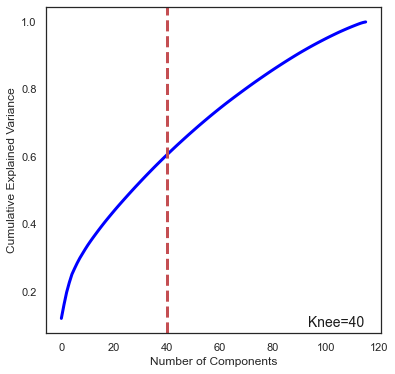

<Figure size 432x288 with 0 Axes>

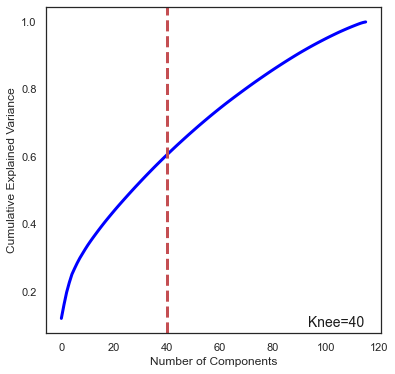


Doing PCA...


PCA Settings:
	n_components: [40, 40]
	scaler: None


Finshed 'fit_transform' in 0:00:00.053108



<Figure size 432x288 with 0 Axes>

In [5]:
pca = runPCA(dimreduction=dr, plot_cumvar=True, show_cumvar=True, keep_pcs=data.indcount-1, elbow=True)

So basically the elbow method chose an inflection point of 40 principal components to keep. 

### 2.2.3 Plotting the PCA

The PCA can then be plotted by calling the plot() method. It can be plotted in 2D or 3D by setting ```plot_3d=False``` or ```plot_3d=True```. Again, lots of plot settings can be changed for customization. See the documentation for all the available options. 

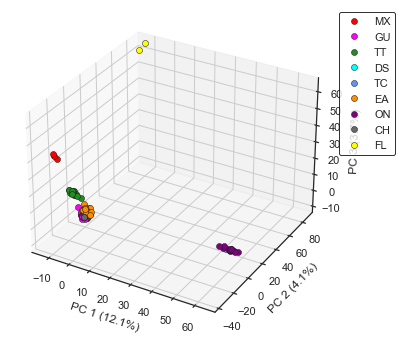

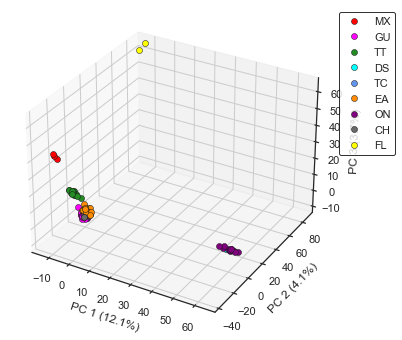



Saved PCA scatterplot(s) to test_output/PCA/plots


In [28]:
pca.plot(plot_3d=True, show_plot=True)

It makes one plot per replicate.  

You can see the legend is overlapping the axis labels a little. That can be fixed. The marker size is a little small too so we can change that with the ```bbox_to_anchor``` argument, which should be a tuple of floating point numbers: ```(x, y). Numbers > 1 will move the legend outside the plot area: ```bbox_to_anchor=(1.15, 1.0)``` will move the legend to the right of the plot area.

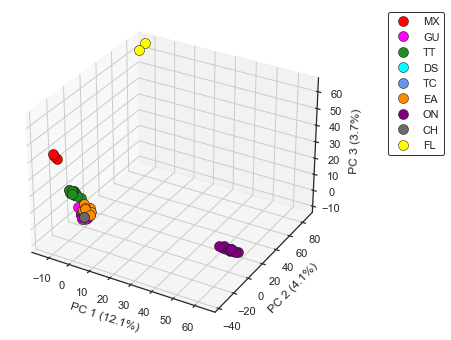

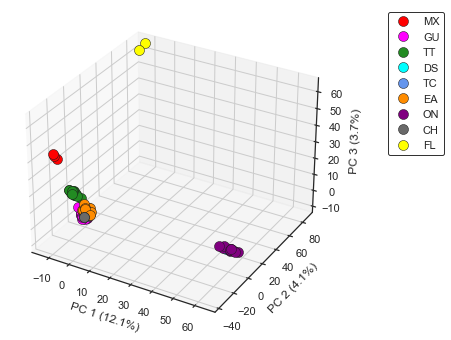



Saved PCA scatterplot(s) to test_output/PCA/plots


In [29]:
pca.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0), markersize=10)

## 2.3 Random Forest Embedding

Random forest embedding embeds the data in high dimensions by one-hot encoding the decision trees into a sparse matrix (i.e., sparse means the dataset has mostly zeros, and when samples are similar in a decision tree they have a 1).  

It is useful for many of the downstream clustering algorithms as it provides a good transformation on the data that many of the machine learning algorithms do well with. We strongly recommend using it. 

It also creates proximity score and dissimilarity score matrices. The proximity score matrix is can be used as  
a similarity matrix, and the dissimilarity score matrix is just 1 - proximity_scores and can be used as  
a distance matrix. Many of the clustering algorithms do better with a custom distance matrix.  

Now we run the random forest embedding. 
 

In [6]:
rf = runRandomForestUML(dimreduction=dr, n_estimators=1000, n_jobs=4)


Doing random forest unsupervised embedding...

Random Forest Embedding Settings:
	n_estimators: 1000
	max_depth: 5
	min_samples_split: 2
	min_samples_leaf: 1
	min_weight_fraction_leaf: 0.0
	max_leaf_nodes: None
	min_impurity_decrease: 0.0
	sparse_output: True
	n_jobs: 4
	random_state: None
	verbose: 0


Finshed 'fit_transform' in 0:00:03.916647



## 2.4 Low-Dimensionality Embedding

### 2.4.1 Multidimensional Scaling
Now you can embed the random forest output into fewer dimensions, just for visualization. The random forest embedding will have too many dimensions to plot. 

Here we are going to use metric multidimensional scaling becuase it allows for non-linear relationships and attempts to preserve distances between points. Note that non-metric MDS (isoMDS) can also be used by setting ```metric=False```, but it does not preserve distances among sample points and is not recommended for most of the clustering algorithms.

A ```runRandomForestUML.rf_model``` object can be supplied or you can use the dissimilarity (i.e., distance) matrix from the runRandomForestUML object as ```runRandomForestUML.dissimilarity```.  

Here we keep 3 dimensions for visualization and increase the iteration and initialization parameters over the defaults. We also first try the ```runRandomForestUML.rf_model``` object.  

In [7]:
rf_cmds = runMDS(dimreduction=dr, rf=rf.rf_model, keep_dims=3, n_init=25, max_iter=2500, n_jobs=4)


Doing cMDS dimensionality reduction...

MDS Settings:
	metric True
	n_dims: 3
	n_init: 25
	max_iter: 2500
	eps: 0.001
	n_jobs: 4
	dissimilarity: euclidean
	random_state: None
	verbose: 0


Finshed 'fit_transform' in 0:00:10.908412



We can plot it the same way as the PCA.  

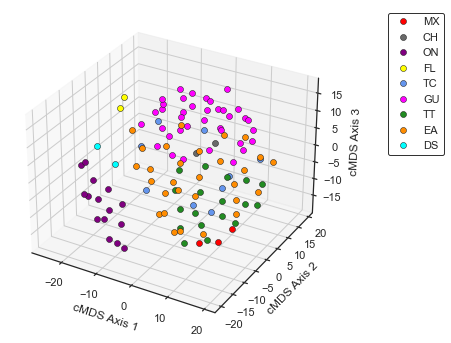

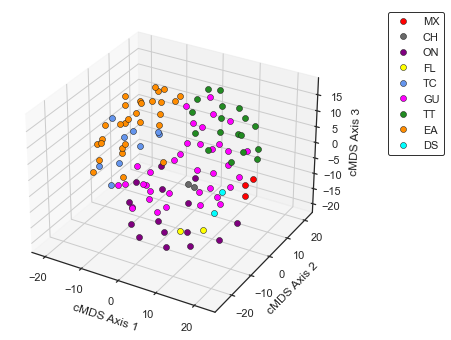



Saved cMDS scatterplot(s) to test_output/cMDS/plots


In [8]:
rf_cmds.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

That was with the ```runRandomForestUML.rf_model``` input. You can also use the ```runRandomForstUML.dissimilarity``` object instead.  

In [9]:
rf_cmds = runMDS(dimreduction=dr, distances=rf.dissimilarity, keep_dims=3, n_init=25, max_iter=2500, n_jobs=4)


Doing cMDS dimensionality reduction...

MDS Settings:
	metric True
	n_dims: 3
	n_init: 25
	max_iter: 2500
	eps: 0.001
	n_jobs: 4
	dissimilarity: precomputed
	random_state: None
	verbose: 0


Finshed 'fit_transform' in 0:00:01.410007



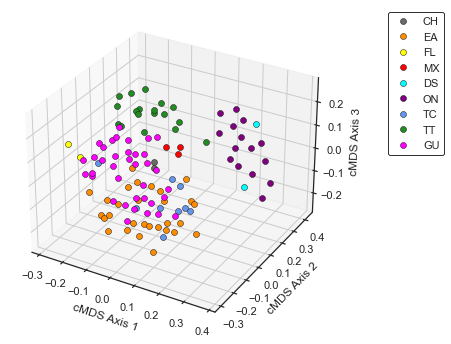

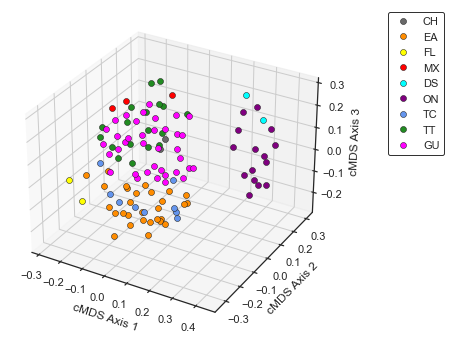



Saved cMDS scatterplot(s) to test_output/cMDS/plots


In [13]:
rf_cmds.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

### 2.4.2 Change Scaler

We can also change the scaler for the genotype data. The defaults scaler is the Patterson scaler from Patterson et al. (2006). This scaler scales the genotypes by unit variance per SNP and it centers the data.

Other options include "standard" and "center". "standard" scales per unit variance and centers the data, and center doesn't standardize the data, it just centers it.

Reference:

Patterson, N., A.L. Price, and D. Reich. 2006. Population structure and Eigenanalysis. PLoS Genetics, 2(12), e190.

Let's try using the ```standard``` option.  



Doing cMDS dimensionality reduction...

MDS Settings:
	metric True
	n_dims: 3
	n_init: 25
	max_iter: 2500
	eps: 0.001
	n_jobs: 4
	dissimilarity: precomputed
	random_state: None
	verbose: 0


Finshed 'fit_transform' in 0:00:01.376647



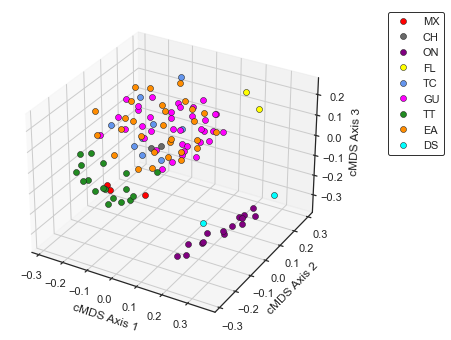

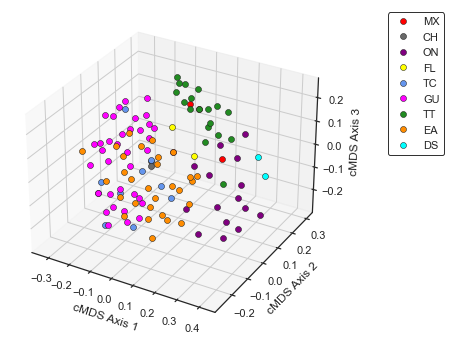



Saved cMDS scatterplot(s) to test_output/cMDS/plots


In [10]:
rf_cmds_std = runMDS(dimreduction=dr, distances=rf.dissimilarity, keep_dims=3, n_init=25, max_iter=2500, n_jobs=4, scaler="standard")

rf_cmds_std.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

Now let's just center it.


Doing cMDS dimensionality reduction...

MDS Settings:
	metric True
	n_dims: 3
	n_init: 25
	max_iter: 2500
	eps: 0.001
	n_jobs: 4
	dissimilarity: precomputed
	random_state: None
	verbose: 0


Finshed 'fit_transform' in 0:00:01.227672



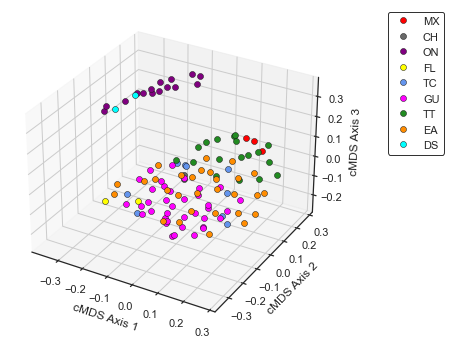

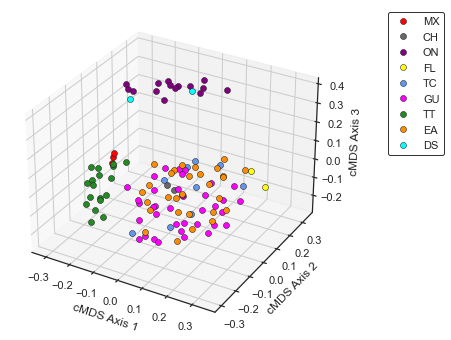



Saved cMDS scatterplot(s) to test_output/cMDS/plots


In [11]:
rf_cmds_center = runMDS(dimreduction=dr, distances=rf.dissimilarity, keep_dims=3, n_init=25, max_iter=2500, n_jobs=4, scaler="center")

rf_cmds_center.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

### 2.4.2 t-SNE 

Now let's try embedding with t-SNE.  
t-SNE has two really important parameters, perplexity and n_iter.  

If perplexity is too low, t-SNE tends to oversplit. If it's too high, t-SNE undersplits.  It essentially is the number of nearest neighbors that are allowed in a local cluster.

If n_iter is set too low, the points will not stabilize and converge during the t-SNE embedding, and you will get a lot more stochasticity in the results.  

Here we supply the ```rf.dissiimilarity``` object to the ```distances``` parameter.  

In [12]:
tsne = runTSNE(dimreduction=dr, distances=rf.dissimilarity, keep_dims=3, perplexity=15.0, n_iter=20000)


Doing T-SNE embedding...

T-SNE Settings:
	n_components: 3
	perplexity: 15.0
	early exaggeration: 12.0
	learning_rate: 200.0
	n_iter: 20000
	min_grad_norm: 1e-07
	metric: precomputed
	init: random
	verbose: 0
	random_state: None
	method: barnes_hut
	angle: 0.5
	n_jobs: 1


Finshed 'fit_transform' in 0:00:40.775906



You can now plot it to visualize the results.  

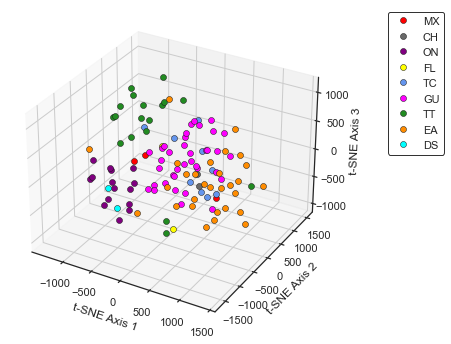

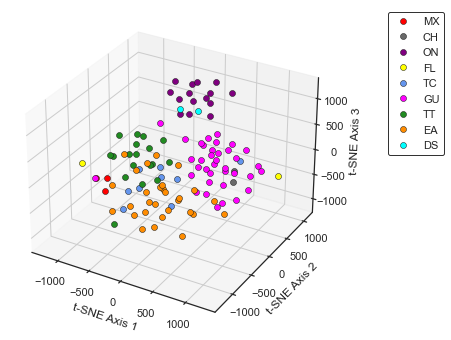



Saved t-SNE scatterplot(s) to test_output/t-SNE/plots


In [13]:
tsne.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

# 3. Unsupervised Cluster Analysis

Now we do some cluster analysis to predict labels for each sample in an unsupervised manner.  

Here we can use the MDS coordinates as input. If using MDS as the input embedding, it is strongly recommended to use metric MDS rather than non-metric because most of the clustering algorithms operate on distance measures. You could use the t-SNE output as well if you wanted to.  
If you use MDS, you should use > 3 dimensions when doing the clustering, because your goal isn't to visualize it, it's to preserve as many aspects of the data as you can while keeping the analysis computationally tractable. Thus, you should establish another ```runMDS()``` instance with ```keep_dims > 3```.  

You can also input the ```runRandomForestUML.dissimilarity``` matrix directly, and some even require this distance matrix input. Alternatively, the 012-encoded genotypes can be input directly in some of the algorithms. 

## 3.1 Relevant terminology

1. Flat versus non-flat geometry: 
+ Non-flat geometry can be applied to clusters that are more circular, spherical, or spiral-shaped, and are good for when standard euclidean distances aren't appropriate.   

2. Transductive versus inductive clustering methods
+ Transductive alrogithms cannot be applied to new, unseen data, whereas inductive algorithms can.  

3. "Embedding": With most of these clustering algorithms, you need to specify an embedding object. The embedding object just means that high-dimensionality data (i.e., 012-encoded genotypes or the sparse random forest embedding) has been reduced to low-dimensionality data while trying to preserve the relationships among clusters. PCA does that too, although PCA, MDS, and t-SNE all do so in different ways. If you don't use the embedding as input for the clustering algorithm, you still have to supply the embedding object because it allows us to visualize and plot the clusters as low-dimensional data.  

4. For many of the algorithms, you have three options for input data. 
+ Use coordinates from a previous embedding as input. If you use this option, preferably ```runMDS()```, ```runTSNE()```, or ```runPCA``` should keep > 3 dimensions to try to tease out as much information as we can. Before when we kept 3 dimensions it was just for plotting. If you aren't going to use the embedding as input, just supply ```runMDS()```, ```runTSNE()```, or ```runPCA``` objects for the sake of plotting. 

+ Supply a distance matrix (e.g., ```runRandomForestUML.dissimilarity```)

+ Use the raw 012-encoded genotypes 

### 3.2 PAM Clustering

Let's start with PAM (Partition Around Medoids) clustering. PAM requires the numbr of clusters to be specified, so Super Deli oes PAM from K=2 to K=maxk and uses other metrics to determine the optimal K. maxk can be any integer, but it makes sense to supply the maximum number of populations that you expect. 

Here we supply the random forest dissimilarity matrix as the distances object, instead of doing a priori embedding with MDS or t-SNE first. An emedding object is still required though so we can plot it later. 

Here we test from K=2 to K=9. 

The sample IDs we can get from the GenotypeData object as ```GenotypeData.individuals```

We're going to use the random forest dissimilarity matrix as input here. We supply it as ```distances=rf.dissimilarity```.


In [14]:
pam_rf = PamClustering(rf_cmds, use_embedding=False, dimreduction=dr, distances=rf.dissimilarity, maxk=9, sampleids=data.individuals, max_iter=2500)


Doing PAM...

PAM Clustering Settings:
	metric: precomputed
	init: heuristic
	max_iter: 2500
	random_state: None


Finshed 'fit_predict' in 0:00:00.202008



### 3.2.1 Evaluating K

Now we can evaluate optimal K using the highest mean silhouette widths (MSW) and the Gap Statistic.

#### MSW

Super Deli also calculates sample-wise silhouette widths and aligns them. K-values with the majority of sample silhouette scores above the mean (red line) are better, and blobs of roughly the same size means the number of samples in each cluster relatively even, which is important for some of the clustering algorithms.  

The red line on the left plot is the mean silhouette width across all samples, the X axis depicts sample-wise silhouette scores (one bar = one sample), and the blobs are all the samples for each cluster, sorted by most to least silhouette scores. The line plot at the end just shows the mean silhouette widths (red lines on the blob plots) across all K. Higher MSW means that the clusters were tighter and better supported, lower MSW means that the clusters were loose and poorly supported.  


Using MSW to get optimal K...


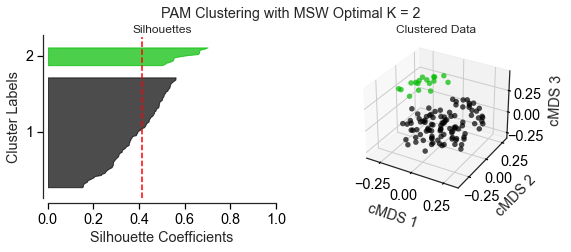

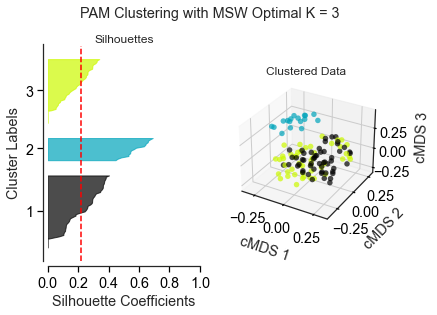

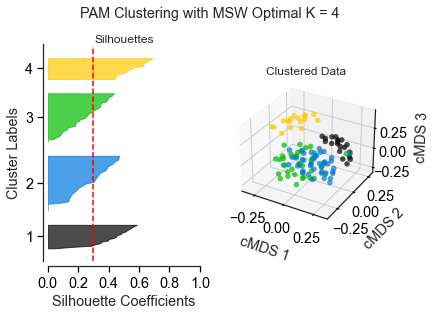

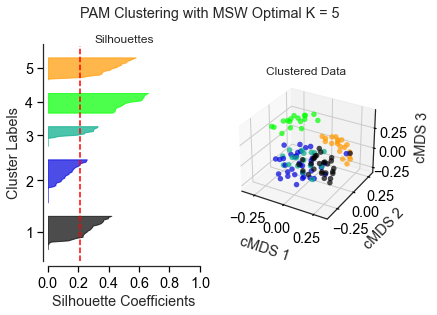

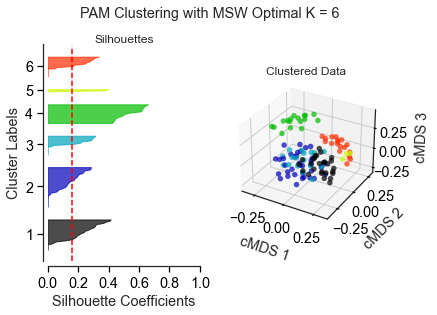

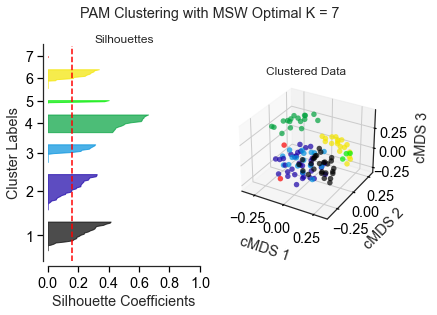

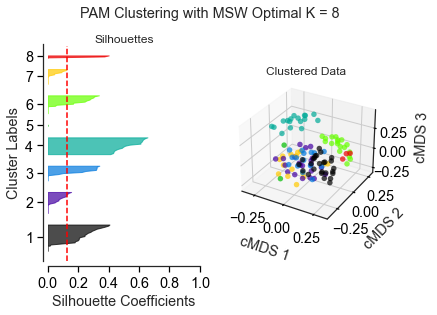

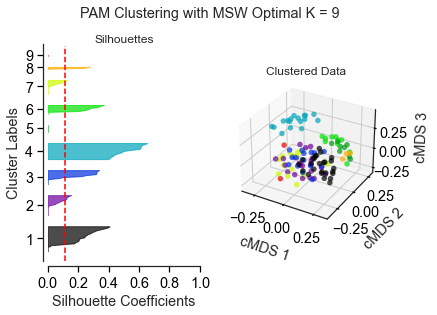

<Figure size 432x288 with 0 Axes>

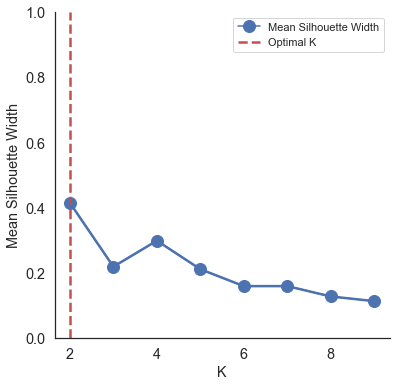

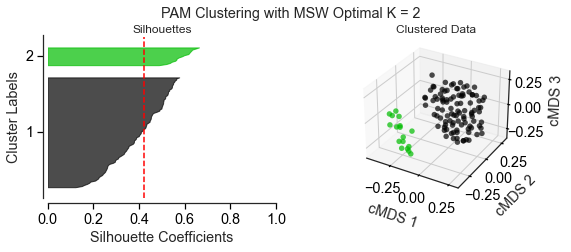

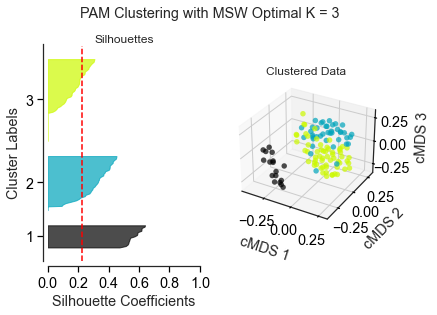

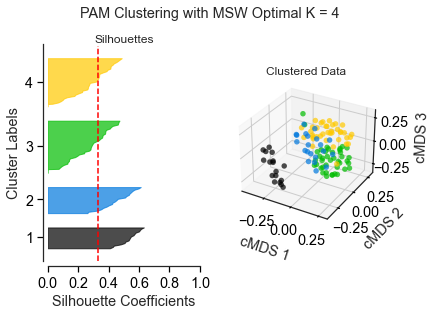

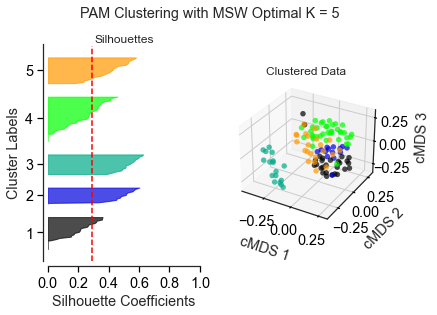

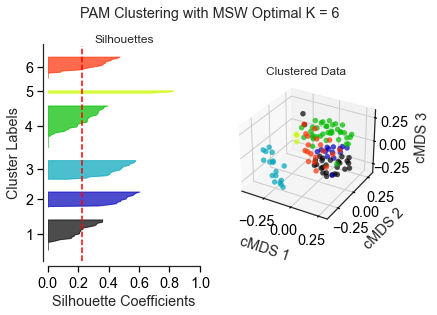

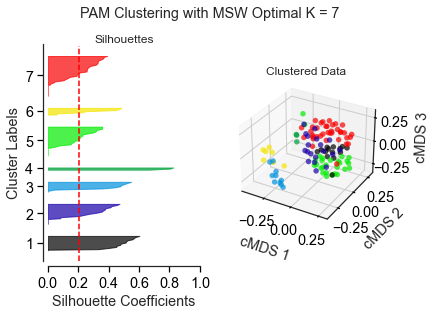

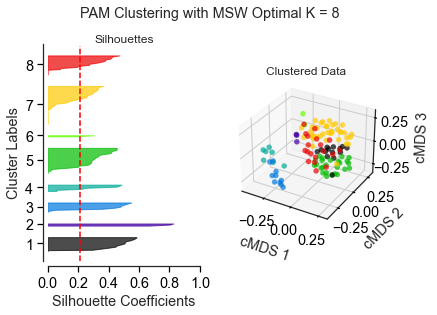

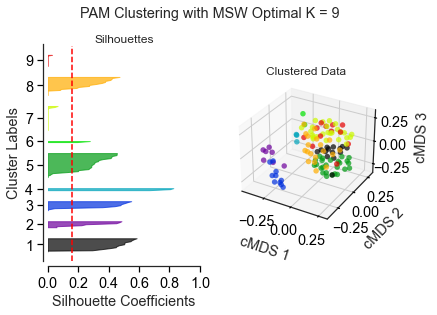

<Figure size 432x288 with 0 Axes>

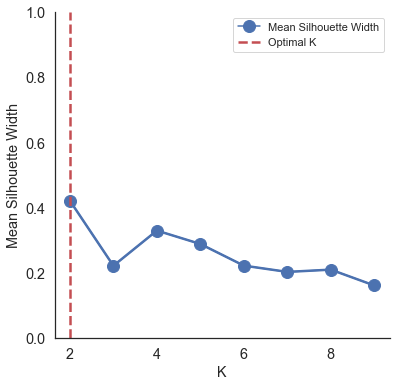

In [15]:
pam_rf.msw(plot_all=True, show_all_plots=True, axes=3)


The highest mean silhouette width was for K=2, though the silhouette blobs show that the cluster sizes are unequal, which might violate the PAM model. 

K=4 has a slightly lower mean MSW, (see line plot at end), but has more evenly sized clusters so this may be a better choice.  

#### Gap Statistic

Let's try the gap statistic. This method only works on models that have the ```intertia_``` attribute. So basically KMedoids and KMeans.  

The gap statistic initializes ```nrefs``` null clusters. 

In [23]:
pam_rf.gapstat(n_init=5, plot_gap=True, show_plot=True)

Could not open or write to file: test_output/cMDS/PAM/labels/labels_1.csv


NameError: name 'maxk' is not defined

## 3.3 K-Means Clustering

K-Means requires either an embedding or it uses the 012-encoded genotypes. It doesn't take a precomputed distance matrix. Like PAM, it also uses a maxk parameter and it also does best with relatively evenly sized and shaped clusters. It also does best with flat geometry.  


Doing K-Means for K=2 to K=10...

K-Means Clustering Settings:
\init k-means++
	n_init: 25
	max_iter: 2500
	tol: 0.0001
	verbose: 0
andom_state: None
lgorithm: auto


Finshed 'fit_predict' in 0:00:03.282688


Using MSW to get optimal K...


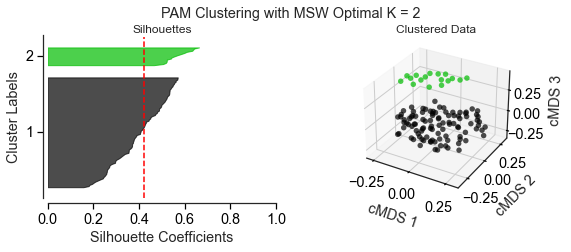

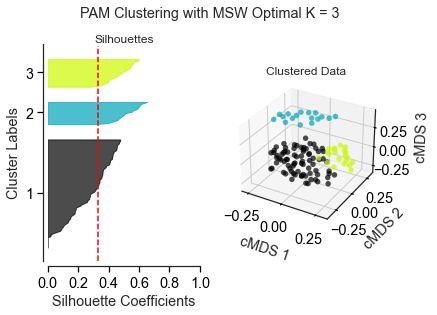

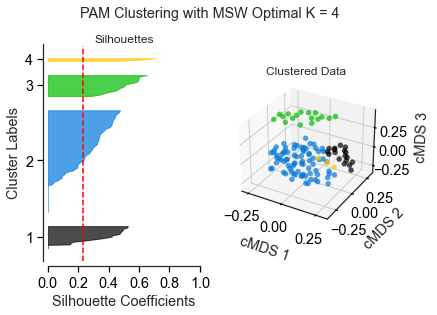

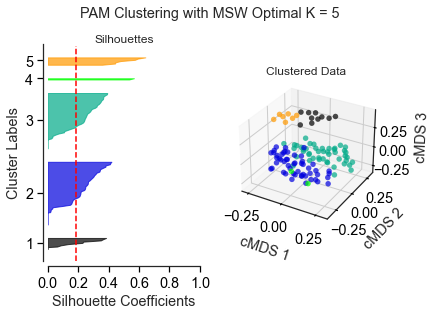

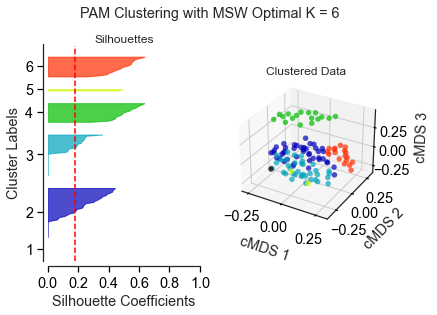

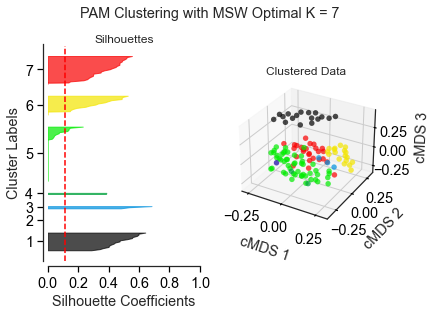

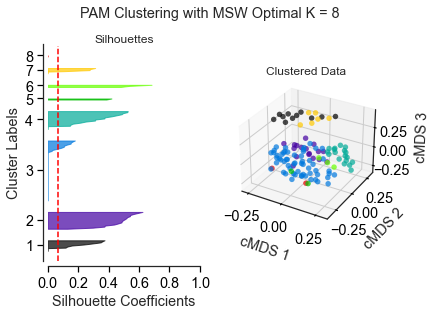

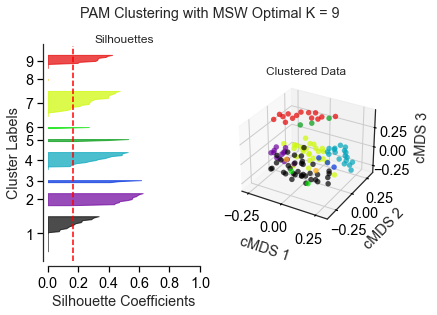

<Figure size 432x288 with 0 Axes>

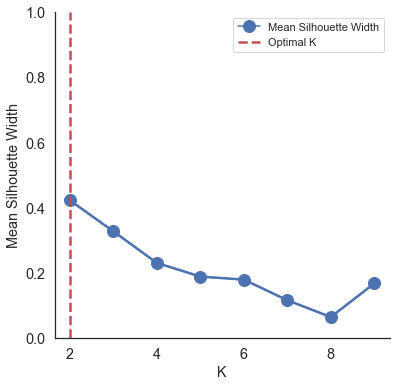

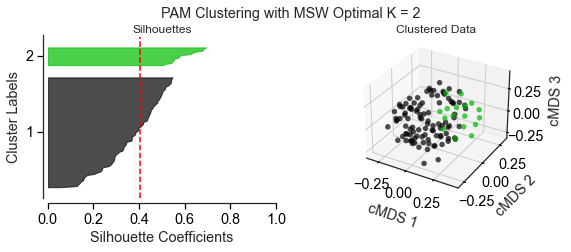

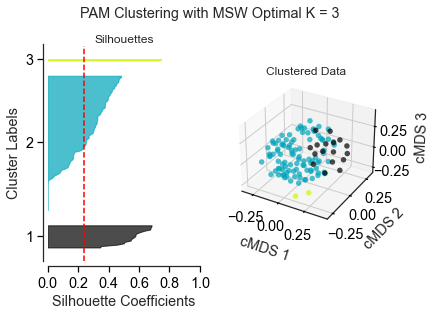

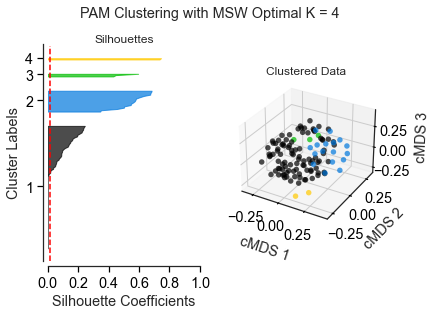

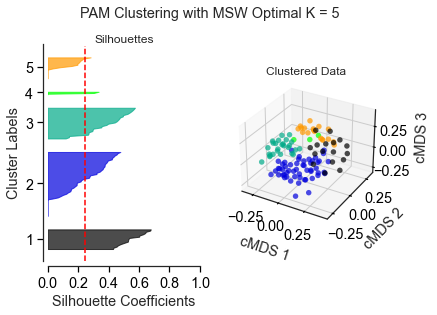

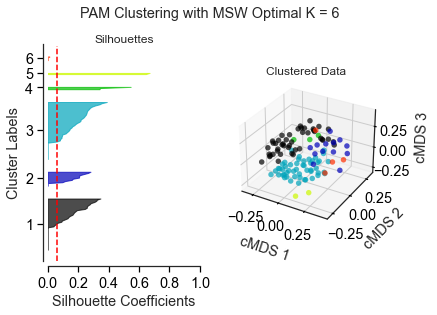

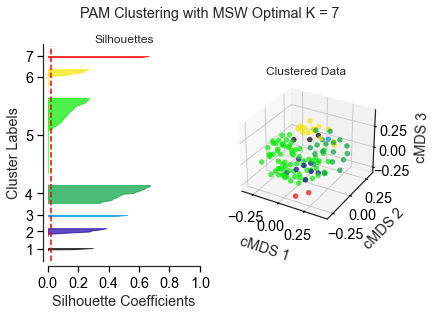

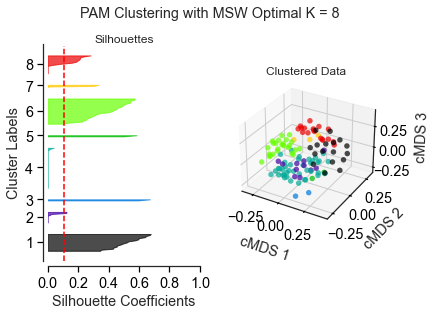

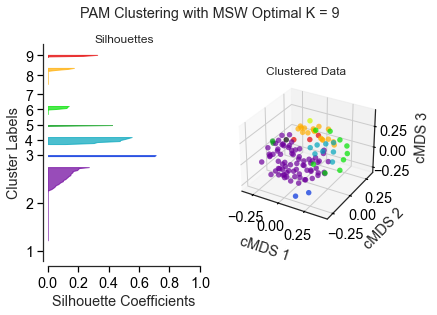

<Figure size 432x288 with 0 Axes>

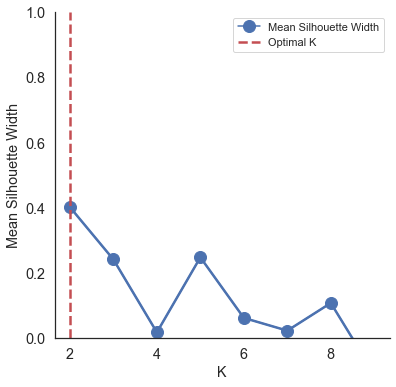

In [40]:
kmeans = KMeansClustering(rf_cmds, use_embedding=False, dimreduction=dr, maxk=9, sampleids=data.individuals, n_init=25, max_iter=2500)

kmeans.msw(plot_all=True, show_all_plots=True, axes=3)

K=2 is still the optimal K here, even moreso than with PAM. Let's try a method that isn't so reliant on even clusters.  

## 2.4 DBSCAN

DBSCAN is a density-based method that identifies dense clusters separated by low-density areas. It is good when there are lots of outliers and it works well with non-flat geometry and uneven cluster sizes. DBSCAN shouldn't be run on MDS-embedded data.  

DBSCAN has a couple important parameters. First, there's eps (epsilon). We have implemented an eps auto-tuner, so you don't need to worry about that. If ```plot_eps=True``` then it will save the plot. It calculates eps as the inflection point of distance X points. 

Another important DBSCAN parameter is min_samples, which determines the minimum number of samples that are required to form a cluster. min_samples is discussed more below.  


Doing DBSCAN Clustering...

DBSCAN Clustering Settings:
	min_samples: 5
	metric: precomputed
	metric_params: None
	algorithm: auto
	leaf_size: 30
	p: None



<Figure size 360x360 with 0 Axes>

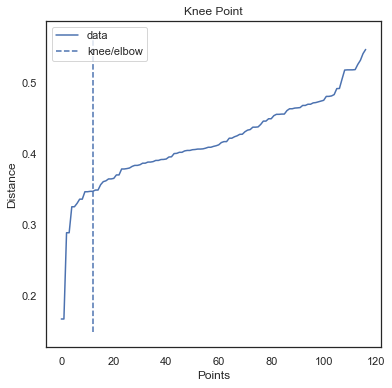

<Figure size 360x360 with 0 Axes>

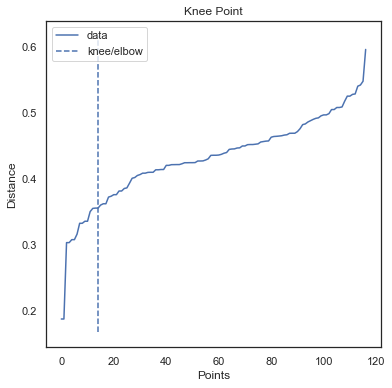


Tuned eps setting: 0.35602949316026994
Finshed 'fit_predict' in 0:00:01.011958



In [42]:
dbscan = DBSCANClustering(rf_cmds, dimreduction=dr, sampleids=data.individuals, plot_eps=True, show_eps=True, distances=rf.dissimilarity, min_samples=5)

You can plot DBSCAN with the plot() method

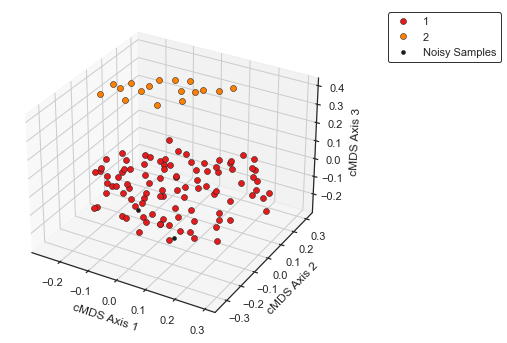

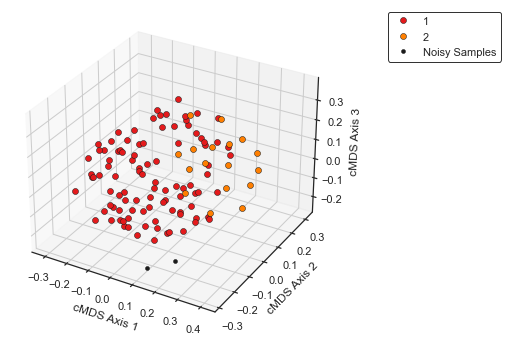



Saved DBSCAN scatterplot(s) to test_output/cMDS/DBSCAN/plots


In [43]:
dbscan.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

### 2.4.1 min_samples Parameter

You can try lowering the min_samples if it returns a lot of noisy samples, which DBSCAN classifies as -1 when predicting the labels. ```min_samples``` determines how many samples need to be in the cluster for it to form. Lower min_samples if K=1 or K is unreasonable low.

On the contrary, if K is unreasonably large then you can raise min_samples. 

Let's try lowering min_samples


Doing DBSCAN Clustering...

DBSCAN Clustering Settings:
	min_samples: 2
	metric: precomputed
	metric_params: None
	algorithm: auto
	leaf_size: 30
	p: None


Tuned eps setting: 0.35602949316026994
Finshed 'fit_predict' in 0:00:00.034331



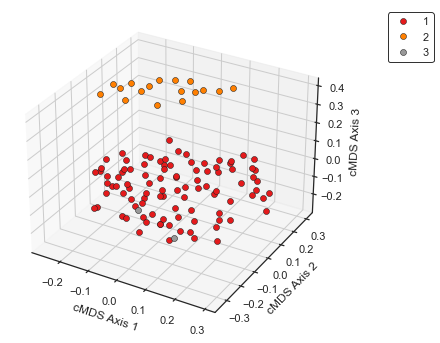

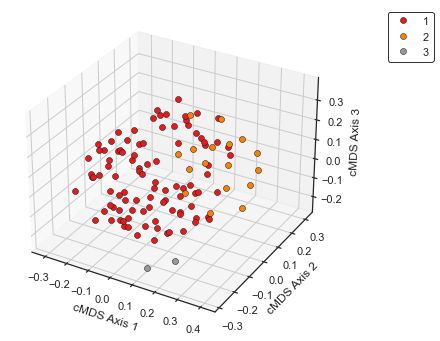



Saved DBSCAN scatterplot(s) to test_output/cMDS/DBSCAN/plots


In [44]:
dbscan = DBSCANClustering(rf_cmds, dimreduction=dr, sampleids=data.individuals, plot_eps=False, show_eps=False, distances=rf.dissimilarity, min_samples=2)

dbscan.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

We got a third cluster, but some of these clusters might not make sense, so you must examine them and use your discretion. 

Let's try DBSCAN with the 012-encoded genotypes. 


Doing DBSCAN Clustering...

DBSCAN Clustering Settings:
	min_samples: 5
	metric: euclidean
	metric_params: None
	algorithm: auto
	leaf_size: 30
	p: None


Tuned eps setting: 67.3012516867418
Finshed 'fit_predict' in 0:00:00.444872



<Figure size 360x360 with 0 Axes>

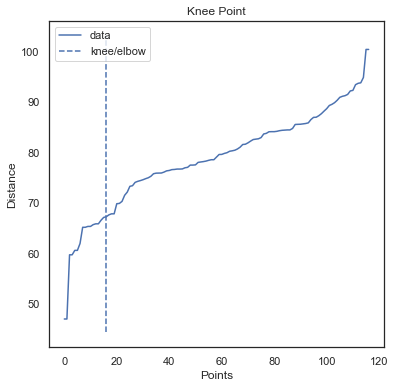

<Figure size 360x360 with 0 Axes>

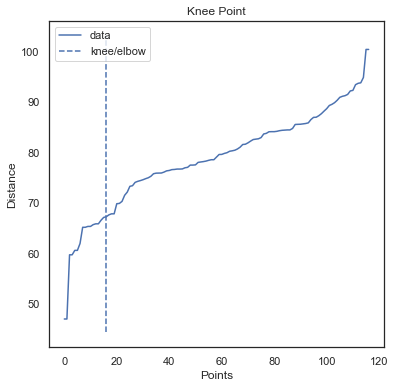

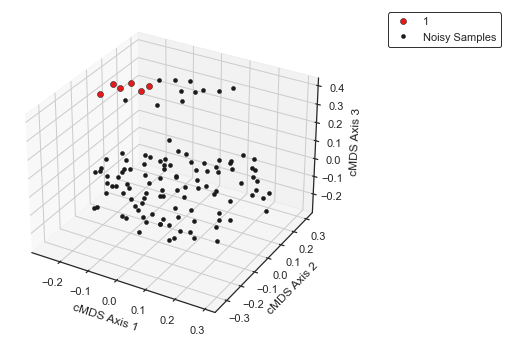

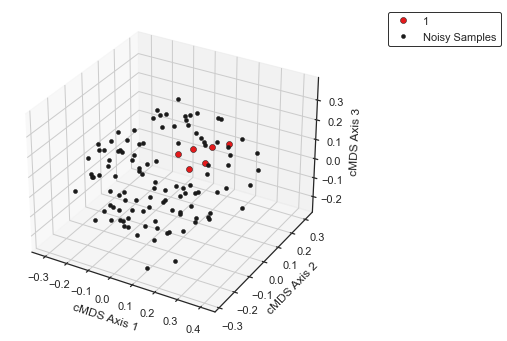



Saved DBSCAN scatterplot(s) to test_output/cMDS/DBSCAN/plots


In [45]:
dbscan_012 = DBSCANClustering(rf_cmds, dimreduction=dr, sampleids=data.individuals, min_samples=5, plot_eps=True)

dbscan_012.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

Lots of those got labeled as outliers. Let's lower min_samples. 


Doing DBSCAN Clustering...

DBSCAN Clustering Settings:
	min_samples: 2
	metric: euclidean
	metric_params: None
	algorithm: auto
	leaf_size: 30
	p: None


Tuned eps setting: 67.3012516867418
Finshed 'fit_predict' in 0:00:00.027230



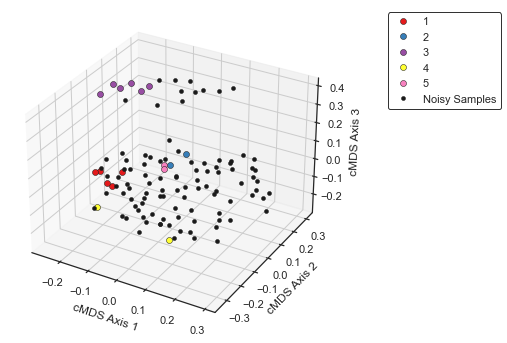

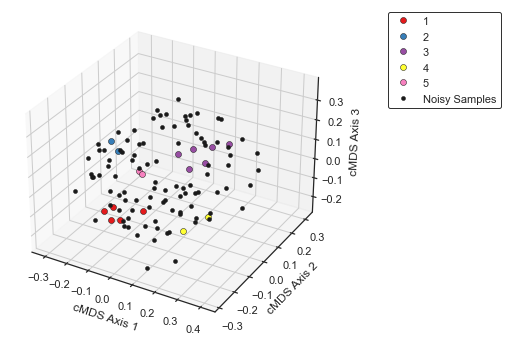



Saved DBSCAN scatterplot(s) to test_output/cMDS/DBSCAN/plots


In [46]:
dbscan_012 = DBSCANClustering(rf_cmds, dimreduction=dr, sampleids=data.individuals, min_samples=2)

dbscan_012.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

Ok so not a good embedding with the 012-encoded genotypes. Feel free to try it with both and see what gives you a better output.  

Seems like supplying the RF dissimilarity matrix gave the best results for DBSCAN

## Affinity Propagation Clustering

Next we'll try affinity propagation clustering. Its strengths allow it to deal with uneven cluster sizes, though it is limited to flat geometry. It also doesn't scale well to large K. 

Affinity Propagation creates clusters by sending messages (i.e. propagating) between pairwise samples until convergence. It finds "examplar" samples that best represent their respective clusters, and messages update which examplars are in which clusters. 

There are two important affinity propagation parameters:

1. Damping
2. preference

Damping basically controls the rate of propagation so that you don't get numerical overflow.

Preference controls how many exemplars are used.

We have implemented auto-tuners for both.

Like DBSCAN, affinity propagation also automatically determines the number of clusters.

Let's run Affinity Propagation.


Doing AffinityPropagation...

Affinity Propagation Settings:
	max_iter: 2500
	convergence_iter: 50
	affinity: precomputed
	verbose: False
	random_state: None


Finshed 'tune_clusters' in 0:00:19.980093


Optimized preference: [0.363, 0.3024]
Optimized damping: [0.5, 0.5]



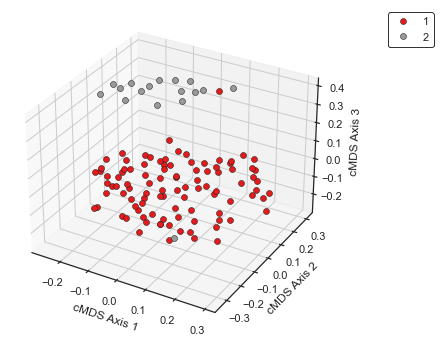

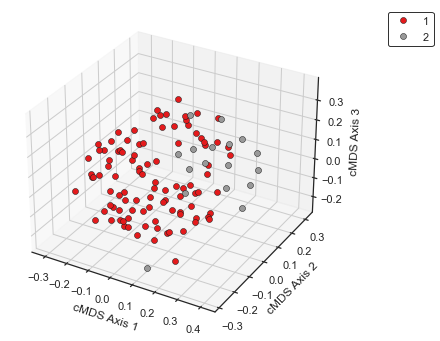



Saved AffinityPropagation scatterplot(s) to test_output/cMDS/AffinityPropagation/plots


In [48]:
affprop = AffinityPropogationClustering(rf_cmds, distances=rf.dissimilarity, dimreduction=dr, sampleids=data.individuals, max_iter=2500, convergence_iter=50)

affprop.plot(plot_3d=True, show_plot=True, bbox_to_anchor=(1.15, 1.0))

Let's try Affinity Propagation on 012-encoded genotypes



### Agglomerative Clustering

Agglomerative clustering is hierarchically groups samples and keeps on merging and splitting them in a bottom-up approach.

Important parameters include the number of clusters, for which we test from K=2 to K=maxk, and the linkage type

In [62]:
agg = AgglomHier(rf_cmds, dimreduction=dr, distances=rf.dissimilarity, maxk=9, sampleids=data.individuals)


Doing Agglomerative for K=2 to K=10...

Agglomerative Clustering Settings:
	affinity: precomputed
	linkage: average


Finshed 'fit_predict' in 0:00:00.059606




Using MSW to get optimal K...


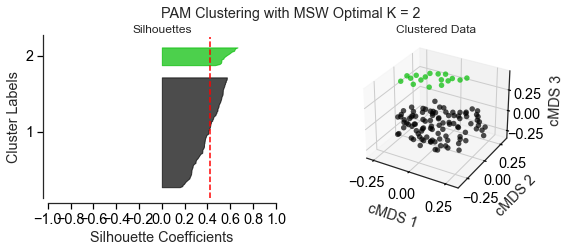

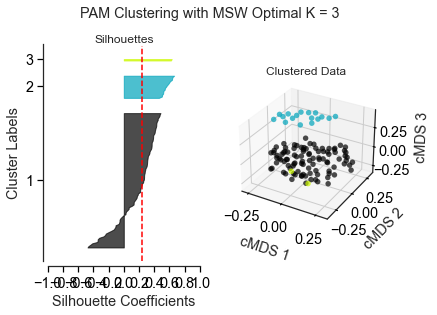

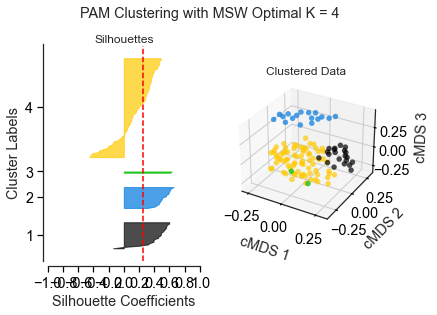

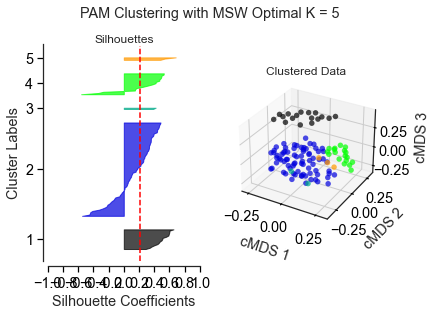

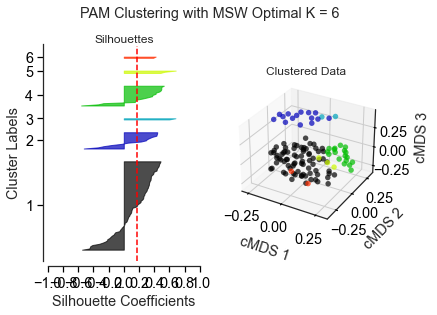

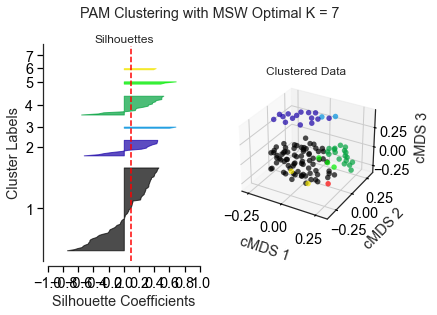

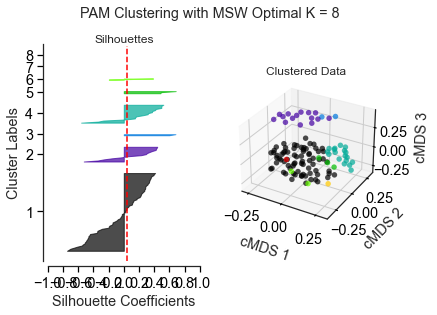

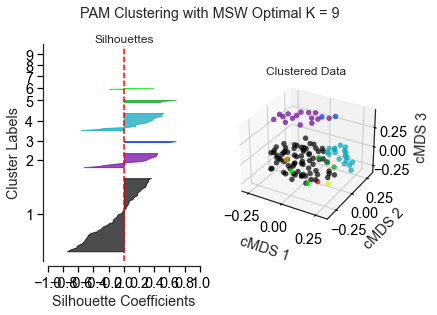

<Figure size 432x288 with 0 Axes>

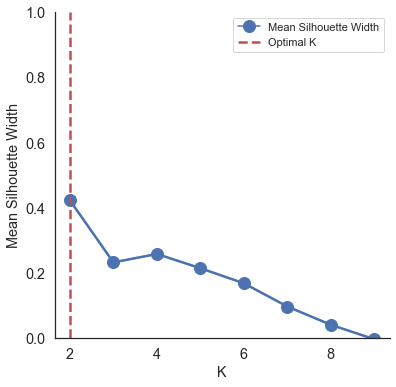

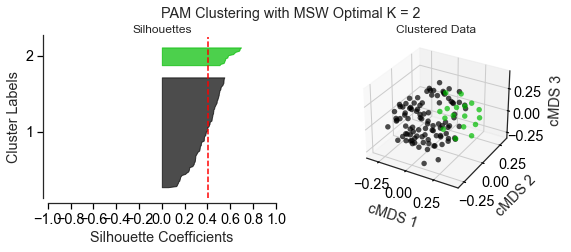

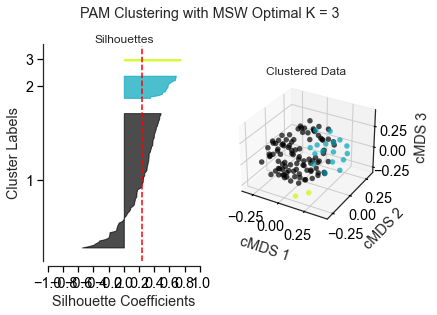

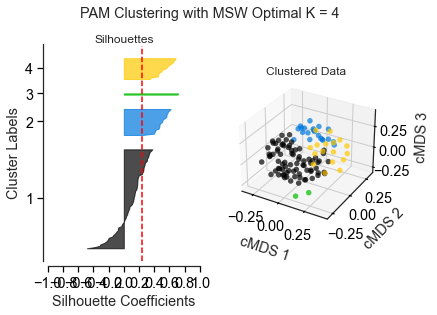

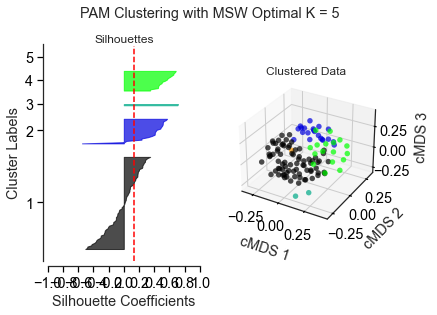

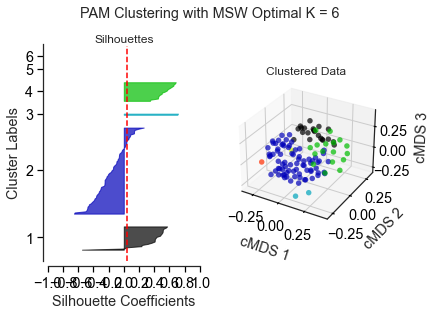

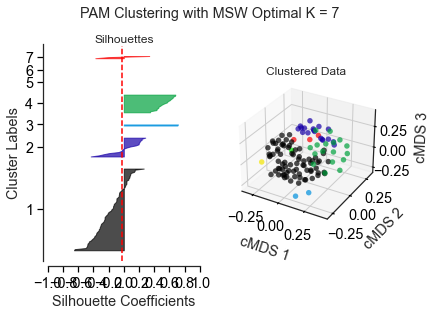

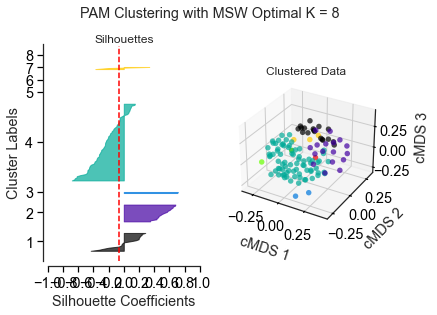

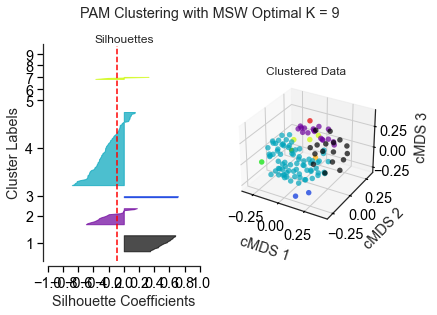

<Figure size 432x288 with 0 Axes>

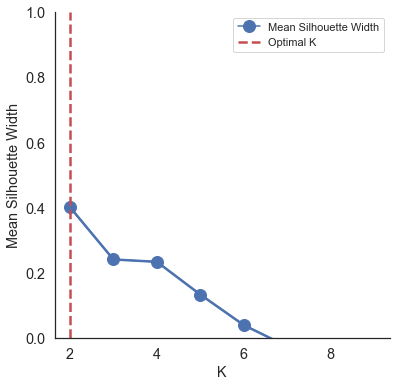

In [64]:
# Lower xmin because the MSW goes below 0.
agg.msw(plot_all=True, show_all_plots=True, axes=3, xmin=-1, )

Higher K goes below 0 here, so K=2 is greatly preferred with Agglomerative Clustering. 